In [263]:

import warnings
import yfinance as yf
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn import metrics
%matplotlib inline
color = sns.color_palette()
import plotly.offline as py
import plotly.express as px
import math





df = pd.DataFrame()
crypto = ['BTC','ETH','LTC','ZEC','AUR','NEO','MZC','BCH','XRP','ADA','XLM','USDT','ETC','XMR','DASH','FIRO','Nano','Dg','ALGO','VET','XTZ']
crypto_name = ['BITCOIN','ETHEREUM','LITECOIN','ZCASH','AURORACOIN','NEO','MAZACOIN','BITCOINCASH','RIPPLE','CARDONA','STELLAR','Tether','Ethereumclassic','Monero','DASH','FIRO','Nano','Dogecoin','ALGORAND','VECHAIN','TEZOS']

for coin in crypto:
    coin_index = crypto.index(coin)
    #for intervals [1m, 2m, 5m, 15m, 30m, 60m, 90m, 1h, 1d, 5d, 1wk, 1mo, 3mo]
    cdf = yf.Ticker(f"{coin}-USD").history(start='2019-03-01', end='2022-03-01', interval="1d" , parse_dates=['Date'])
    cdf = pd.DataFrame(cdf)
    cdf['name'] = crypto_name[coin_index]
    cdf['symbol'] = coin
    df = df.append(cdf)

print(df.reset_index())
df.to_csv('my_crypto_data.csv')


- MZC-USD: No data found, symbol may be delisted
- NANO-USD: No data found for this date range, symbol may be delisted
            Date         Open         High          Low        Close  \
0     2019-03-01  3853.757080  3907.795410  3851.692383  3859.583740   
1     2019-03-02  3855.318115  3874.607422  3832.127930  3864.415039   
2     2019-03-03  3862.266113  3875.483643  3836.905762  3847.175781   
3     2019-03-04  3845.091553  3867.381836  3733.749756  3761.557129   
4     2019-03-05  3759.832520  3903.916748  3745.183105  3896.375000   
...          ...          ...          ...          ...          ...   
20029 2022-02-25     3.032464     3.248102     2.969217     3.205754   
20030 2022-02-26     3.206210     3.486655     3.206210     3.416615   
20031 2022-02-27     3.415262     3.443890     3.079345     3.115932   
20032 2022-02-28     3.114904     3.556565     3.044700     3.534633   
20033 2022-03-01     3.534616     3.659134     3.430242     3.489519   

             Vol

In [264]:
df = pd.read_csv('my_crypto_data.csv')
print(df.shape)

(20034, 11)


In [265]:
df.dtypes

Date             object
Open            float64
High            float64
Low             float64
Close           float64
Volume          float64
Dividends       float64
Stock Splits    float64
name             object
symbol           object
Adj Close       float64
dtype: object

In [266]:
df.head(5)
df.tail(5)

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,name,symbol,Adj Close
20029,2022-02-25,3.032464,3.248102,2.969217,3.205754,170038301.0,0.0,0.0,TEZOS,XTZ,NaN
20030,2022-02-26,3.206210,3.486655,3.206210,3.416615,184081442.0,0.0,0.0,TEZOS,XTZ,NaN
20031,2022-02-27,3.415262,3.443890,3.079345,3.115932,185266059.0,0.0,0.0,TEZOS,XTZ,NaN
20032,2022-02-28,3.114904,3.556565,3.044700,3.534633,169933337.0,0.0,0.0,TEZOS,XTZ,NaN
20033,2022-03-01,3.534616,3.659134,3.430242,3.489519,159859702.0,0.0,0.0,TEZOS,XTZ,NaN


In [267]:
df.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Adj Close
count,20034.000000,20034.000000,20034.000000,20034.000000,2.003400e+04,20034.0,20034.0,0.0
mean,1435.836822,1475.523911,1392.542946,1437.782820,6.669849e+09,0.0,0.0,NaN
std,7039.268835,7227.299491,6826.991616,7044.155794,1.762982e+10,0.0,0.0,NaN
min,0.002258,0.002474,0.001678,0.002274,0.000000e+00,0.0,0.0,NaN
25%,0.410506,0.433465,0.390685,0.411778,1.265217e+08,0.0,0.0,NaN
50%,7.282370,7.602754,6.997424,7.283823,5.204034e+08,0.0,0.0,NaN
75%,133.482239,138.142696,127.571150,133.514759,2.968939e+09,0.0,0.0,NaN
max,67549.734375,68789.625000,66382.062500,67566.828125,3.509679e+11,0.0,0.0,NaN


In [268]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20034 entries, 0 to 20033
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          20034 non-null  object 
 1   Open          20034 non-null  float64
 2   High          20034 non-null  float64
 3   Low           20034 non-null  float64
 4   Close         20034 non-null  float64
 5   Volume        20034 non-null  float64
 6   Dividends     20034 non-null  float64
 7   Stock Splits  20034 non-null  float64
 8   name          20034 non-null  object 
 9   symbol        20034 non-null  object 
 10  Adj Close     0 non-null      float64
dtypes: float64(8), object(3)
memory usage: 1.7+ MB


In [269]:
from plotly.figure_factory import create_table
table = create_table(df.head(5), colorscale='plasma')
py.iplot(table)

In [270]:
df

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,name,symbol,Adj Close
0,2019-03-01,3853.757080,3907.795410,3851.692383,3859.583740,7.661248e+09,0.0,0.0,BITCOIN,BTC,NaN
1,2019-03-02,3855.318115,3874.607422,3832.127930,3864.415039,7.578786e+09,0.0,0.0,BITCOIN,BTC,NaN
2,2019-03-03,3862.266113,3875.483643,3836.905762,3847.175781,7.253558e+09,0.0,0.0,BITCOIN,BTC,NaN
3,2019-03-04,3845.091553,3867.381836,3733.749756,3761.557129,9.029176e+09,0.0,0.0,BITCOIN,BTC,NaN
4,2019-03-05,3759.832520,3903.916748,3745.183105,3896.375000,1.017413e+10,0.0,0.0,BITCOIN,BTC,NaN
...,...,...,...,...,...,...,...,...,...,...,...
20029,2022-02-25,3.032464,3.248102,2.969217,3.205754,1.700383e+08,0.0,0.0,TEZOS,XTZ,NaN
20030,2022-02-26,3.206210,3.486655,3.206210,3.416615,1.840814e+08,0.0,0.0,TEZOS,XTZ,NaN
20031,2022-02-27,3.415262,3.443890,3.079345,3.115932,1.852661e+08,0.0,0.0,TEZOS,XTZ,NaN
20032,2022-02-28,3.114904,3.556565,3.044700,3.534633,1.699333e+08,0.0,0.0,TEZOS,XTZ,NaN


In [271]:
#We need to check for null/missing values
df.isnull().sum()

Date                0
Open                0
High                0
Low                 0
Close               0
Volume              0
Dividends           0
Stock Splits        0
name                0
symbol              0
Adj Close       20034
dtype: int64

In [272]:
df.dropna().sum()

Date            0.0
Open            0.0
High            0.0
Low             0.0
Close           0.0
Volume          0.0
Dividends       0.0
Stock Splits    0.0
name            0.0
symbol          0.0
Adj Close       0.0
dtype: float64

In [273]:
#calculating the mean
print(df.mean(axis=0))

Open            1.435837e+03
High            1.475524e+03
Low             1.392543e+03
Close           1.437783e+03
Volume          6.669849e+09
Dividends       0.000000e+00
Stock Splits    0.000000e+00
Adj Close                NaN
dtype: float64


In [274]:
#calculating the median
print(df.median(axis=0))

Open            7.282370e+00
High            7.602754e+00
Low             6.997424e+00
Close           7.283823e+00
Volume          5.204034e+08
Dividends       0.000000e+00
Stock Splits    0.000000e+00
Adj Close                NaN
dtype: float64


In [275]:
#calculating the mode
print(df.mode(axis=0))

           Date      Open    High     Low     Close  Volume  Dividends  \
0    2020-12-03  0.040703  1.0002  0.9998  0.040703     0.0        0.0   
1    2020-12-04       NaN     NaN     NaN       NaN     NaN        NaN   
2    2020-12-05       NaN     NaN     NaN       NaN     NaN        NaN   
3    2020-12-06       NaN     NaN     NaN       NaN     NaN        NaN   
4    2020-12-07       NaN     NaN     NaN       NaN     NaN        NaN   
..          ...       ...     ...     ...       ...     ...        ...   
395  2022-01-30       NaN     NaN     NaN       NaN     NaN        NaN   
396  2022-01-31       NaN     NaN     NaN       NaN     NaN        NaN   
397  2022-02-01       NaN     NaN     NaN       NaN     NaN        NaN   
398  2022-02-02       NaN     NaN     NaN       NaN     NaN        NaN   
399  2022-03-01       NaN     NaN     NaN       NaN     NaN        NaN   

     Stock Splits         name symbol  Adj Close  
0             0.0   AURORACOIN    ADA        NaN  
1        

In [276]:
#Analysing volume using box plot
x=[]
y=[]
px.box(df, x="name", y="Volume")

In [277]:
#analysing volume using pie chart
px.pie(df, values="Volume", names="name")

array([[<AxesSubplot:title={'center':'Volume'}>]], dtype=object)

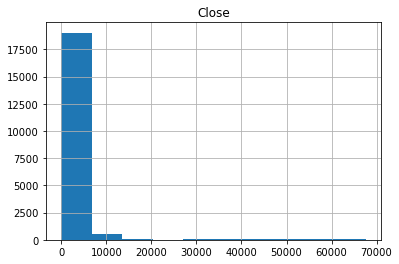

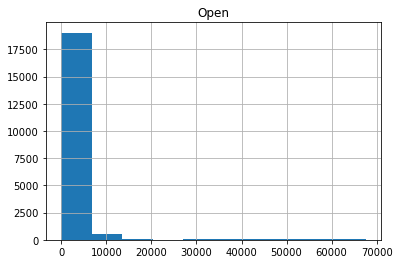

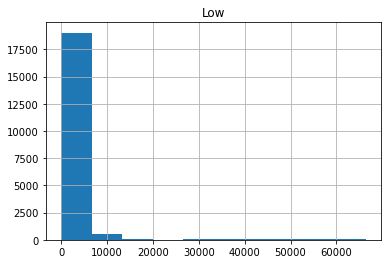

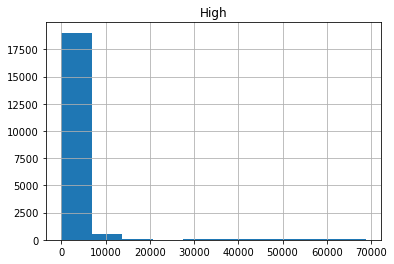

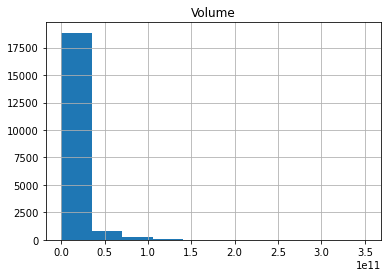

In [278]:
df.hist(column='Close')
df.hist(column='Open')
df.hist(column='Low')
df.hist(column='High')
df.hist(column='Volume')

In [279]:
#area graph (Date Vs Price)
px.area(df,
        x='Date',
        y='Close')

<AxesSubplot:>

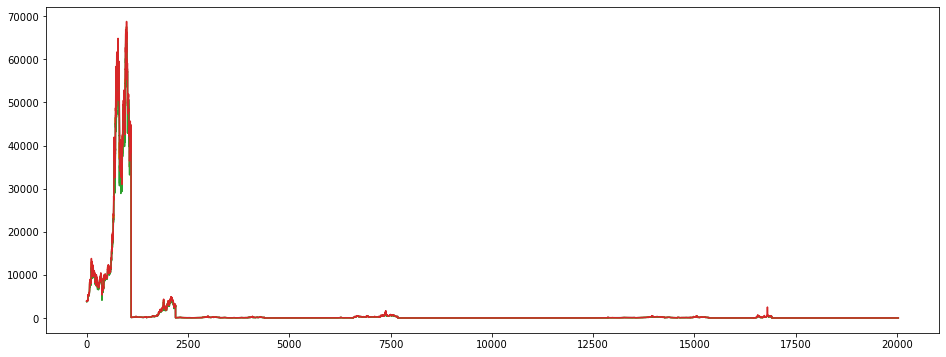

In [280]:
df['Open'].plot(figsize=(16,6))
df['Close'].plot(figsize=(16,6))
df['Low'].plot(figsize=(16,6))
df['High'].plot(figsize=(16,6))

In [281]:
#Analysing close price using violin
px.violin(df, x="name", y="Close")

In [282]:
px.box(df, x="name", y="Close", log_y=True)

In [283]:
#Using scatter plot to display different coins
px.scatter(df, x="Close", y="Volume", hover_data=['High', 'Low'], color="name", height=400)

In [284]:
#Creating correlation table
df_correlation= df.corr(method='pearson')
print(df_correlation)

                  Open      High       Low     Close    Volume  Dividends  \
Open          1.000000  0.999681  0.999405  0.999208  0.366558        NaN   
High          0.999681  1.000000  0.999364  0.999652  0.367938        NaN   
Low           0.999405  0.999364  1.000000  0.999589  0.363712        NaN   
Close         0.999208  0.999652  0.999589  1.000000  0.366184        NaN   
Volume        0.366558  0.367938  0.363712  0.366184  1.000000        NaN   
Dividends          NaN       NaN       NaN       NaN       NaN        NaN   
Stock Splits       NaN       NaN       NaN       NaN       NaN        NaN   
Adj Close          NaN       NaN       NaN       NaN       NaN        NaN   

              Stock Splits  Adj Close  
Open                   NaN        NaN  
High                   NaN        NaN  
Low                    NaN        NaN  
Close                  NaN        NaN  
Volume                 NaN        NaN  
Dividends              NaN        NaN  
Stock Splits           NaN

In [285]:
#Extracting the bitcoin data from the dataframe

btc = yf.Ticker('BTC-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
btc

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2019-03-01,3853.757080,3907.795410,3851.692383,3859.583740,7661247975,0,0
2019-03-02,3855.318115,3874.607422,3832.127930,3864.415039,7578786076,0,0
2019-03-03,3862.266113,3875.483643,3836.905762,3847.175781,7253558152,0,0
2019-03-04,3845.091553,3867.381836,3733.749756,3761.557129,9029175788,0,0
2019-03-05,3759.832520,3903.916748,3745.183105,3896.375000,10174126415,0,0
...,...,...,...,...,...,...,...
2022-02-25,38333.746094,39630.324219,38111.343750,39214.218750,26545599159,0,0
2022-02-26,39213.082031,40005.347656,38702.535156,39105.148438,17467554129,0,0
2022-02-27,39098.699219,39778.941406,37268.976562,37709.785156,23450127612,0,0


In [286]:
btc.shape

(1097, 7)

In [287]:
btc.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2019-03-01,3853.757080,3907.795410,3851.692383,3859.583740,7661247975,0,0
2019-03-02,3855.318115,3874.607422,3832.127930,3864.415039,7578786076,0,0
2019-03-03,3862.266113,3875.483643,3836.905762,3847.175781,7253558152,0,0
2019-03-04,3845.091553,3867.381836,3733.749756,3761.557129,9029175788,0,0
2019-03-05,3759.832520,3903.916748,3745.183105,3896.375000,10174126415,0,0


In [288]:
btc.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2022-02-25,38333.746094,39630.324219,38111.343750,39214.218750,26545599159,0,0
2022-02-26,39213.082031,40005.347656,38702.535156,39105.148438,17467554129,0,0
2022-02-27,39098.699219,39778.941406,37268.976562,37709.785156,23450127612,0,0
2022-02-28,37706.000000,43760.457031,37518.214844,43193.234375,35690014104,0,0
2022-03-01,43194.503906,44793.601562,42952.585938,44354.636719,32479047645,0,0


In [289]:
btc.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1097 entries, 2019-03-01 to 2022-03-01
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          1097 non-null   float64
 1   High          1097 non-null   float64
 2   Low           1097 non-null   float64
 3   Close         1097 non-null   float64
 4   Volume        1097 non-null   int64  
 5   Dividends     1097 non-null   int64  
 6   Stock Splits  1097 non-null   int64  
dtypes: float64(4), int64(3)
memory usage: 68.6 KB


In [290]:
print(len(btc))

1097


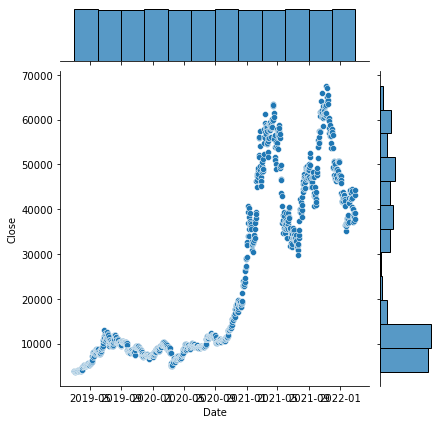

In [291]:
sns.jointplot(x='Date', y='Close', data=btc)

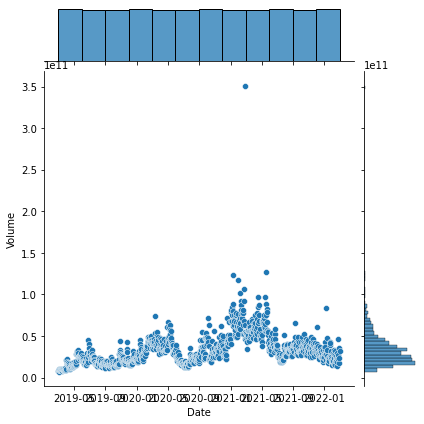

In [292]:
sns.jointplot(x='Date', y='Volume', data=btc)

<AxesSubplot:xlabel='Date'>

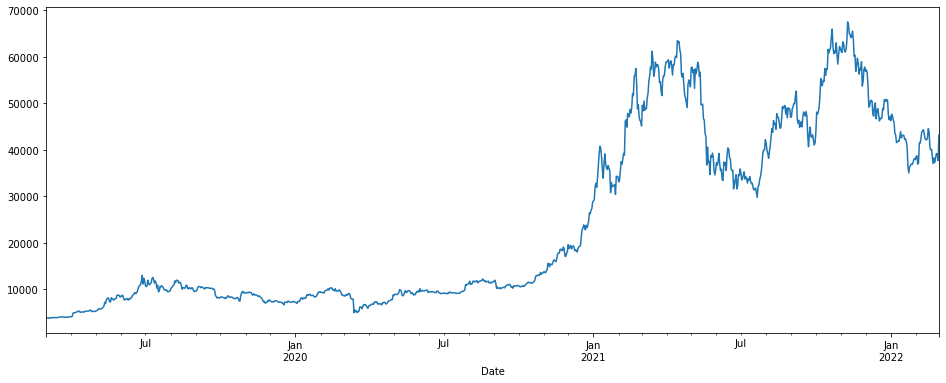

In [293]:
btc['Open'].plot(figsize= (16,6))

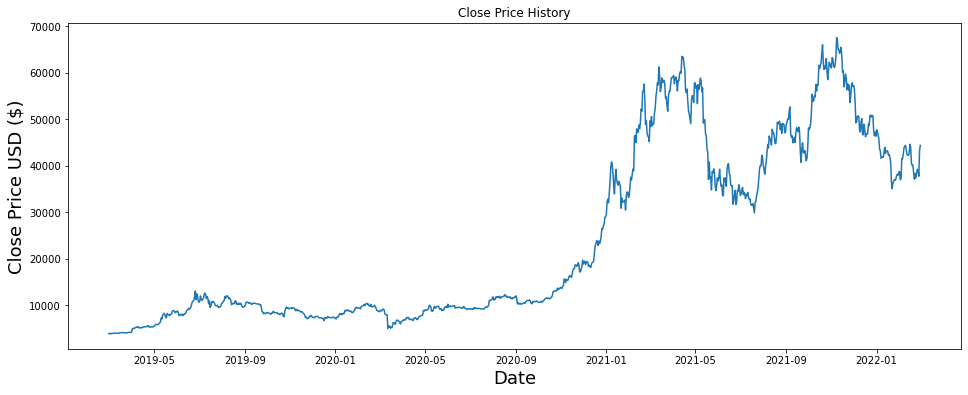

In [294]:
plt.figure(figsize=(16,6))
plt.title('Close Price History')
plt.plot(btc['Close'])
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.show()

In [295]:
#Data preparation
new_btc = btc.drop(btc.columns[[0,1,2,4,5,6]], axis=1)
new_btc.columns = ['y']
df_btc = pd.DataFrame(new_btc.index)

df_btc['y'] = new_btc.to_numpy()


df_btc.columns = ['ds', 'y']

In [296]:
new_btc

,y
Date,
2019-03-01,3859.583740
2019-03-02,3864.415039
2019-03-03,3847.175781
2019-03-04,3761.557129
2019-03-05,3896.375000
...,...
2022-02-25,39214.218750
2022-02-26,39105.148438
2022-02-27,37709.785156


In [297]:
df_btc['y_orig'] = df_btc['y']
# log-transform y
df_btc['y'] = np.log(df_btc['y'])
print(df_btc)

             ds          y        y_orig
0    2019-03-01   8.258315   3859.583740
1    2019-03-02   8.259566   3864.415039
2    2019-03-03   8.255095   3847.175781
3    2019-03-04   8.232588   3761.557129
4    2019-03-05   8.267802   3896.375000
...         ...        ...           ...
1092 2022-02-25  10.576795  39214.218750
1093 2022-02-26  10.574009  39105.148438
1094 2022-02-27  10.537675  37709.785156
1095 2022-02-28  10.673439  43193.234375
1096 2022-03-01  10.699973  44354.636719

[1097 rows x 3 columns]


In [298]:
df_btc.dtypes

ds        datetime64[ns]
y                float64
y_orig           float64
dtype: object

In [299]:
m = Prophet(interval_width=0.95, daily_seasonality=True)
model = m.fit(df_btc)

In [300]:
future = m.make_future_dataframe(periods=100, freq='D')
forecast = m.predict(future)

In [301]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-03-01,8.270547,8.191931,8.456974,8.270547,8.270547,0.053164,0.053164,0.053164,0.136357,...,-0.000298,-0.000298,-0.000298,-0.082895,-0.082895,-0.082895,0.0,0.0,0.0,8.323711
1,2019-03-02,8.279977,8.185318,8.444672,8.279977,8.279977,0.037119,0.037119,0.037119,0.136357,...,-0.000089,-0.000089,-0.000089,-0.099148,-0.099148,-0.099148,0.0,0.0,0.0,8.317097
2,2019-03-03,8.289407,8.174311,8.439910,8.289407,8.289407,0.018730,0.018730,0.018730,0.136357,...,-0.001938,-0.001938,-0.001938,-0.115689,-0.115689,-0.115689,0.0,0.0,0.0,8.308137
3,2019-03-04,8.298837,8.183121,8.442341,8.298837,8.298837,0.005519,0.005519,0.005519,0.136357,...,0.001501,0.001501,0.001501,-0.132338,-0.132338,-0.132338,0.0,0.0,0.0,8.304357
4,2019-03-05,8.308267,8.166044,8.430276,8.308267,8.308267,-0.012303,-0.012303,-0.012303,0.136357,...,0.000257,0.000257,0.000257,-0.148917,-0.148917,-0.148917,0.0,0.0,0.0,8.295965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1192,2022-06-05,10.448558,9.185847,11.545582,9.437565,11.694597,-0.160333,-0.160333,-0.160333,0.136357,...,-0.001938,-0.001938,-0.001938,-0.294752,-0.294752,-0.294752,0.0,0.0,0.0,10.288225
1193,2022-06-06,10.448429,9.216500,11.595540,9.418709,11.715259,-0.155022,-0.155022,-0.155022,0.136357,...,0.001501,0.001501,0.001501,-0.292880,-0.292880,-0.292880,0.0,0.0,0.0,10.293407
1194,2022-06-07,10.448300,9.212134,11.548556,9.399853,11.735922,-0.153273,-0.153273,-0.153273,0.136357,...,0.000257,0.000257,0.000257,-0.289887,-0.289887,-0.289887,0.0,0.0,0.0,10.295028
1195,2022-06-08,10.448171,9.236081,11.633722,9.380998,11.756584,-0.146364,-0.146364,-0.146364,0.136357,...,0.003087,0.003087,0.003087,-0.285808,-0.285808,-0.285808,0.0,0.0,0.0,10.301808


In [302]:
model.component_modes

{'additive': ['yearly',
  'weekly',
  'daily',
  'additive_terms',
  'extra_regressors_additive',
  'holidays'],
 'multiplicative': ['multiplicative_terms', 'extra_regressors_multiplicative']}

In [303]:
forecast[['ds', 'yhat']]

,ds,yhat
0,2019-03-01,8.323711
1,2019-03-02,8.317097
2,2019-03-03,8.308137
3,2019-03-04,8.304357
4,2019-03-05,8.295965
...,...,...
1192,2022-06-05,10.288225
1193,2022-06-06,10.293407
1194,2022-06-07,10.295028
1195,2022-06-08,10.301808


In [304]:
df_btc['y_orig'] = df_btc['y']
# log-transform y
df_btc['y'] = np.log(df_btc['y'])
print(df_btc)

             ds         y     y_orig
0    2019-03-01  2.111221   8.258315
1    2019-03-02  2.111372   8.259566
2    2019-03-03  2.110831   8.255095
3    2019-03-04  2.108100   8.232588
4    2019-03-05  2.112369   8.267802
...         ...       ...        ...
1092 2022-02-25  2.358662  10.576795
1093 2022-02-26  2.358399  10.574009
1094 2022-02-27  2.354957  10.537675
1095 2022-02-28  2.367758  10.673439
1096 2022-03-01  2.370241  10.699973

[1097 rows x 3 columns]


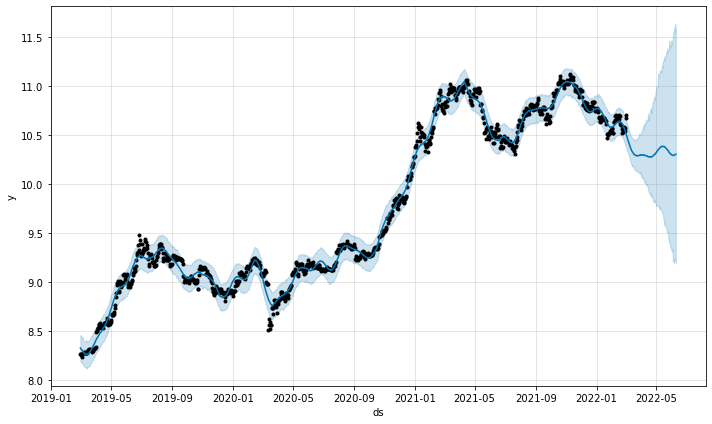

In [305]:
plot1 = m.plot(forecast)

In [306]:
def fb_plot(m,fore):
    return m.plot(forecast), m.plot_components(forecast)

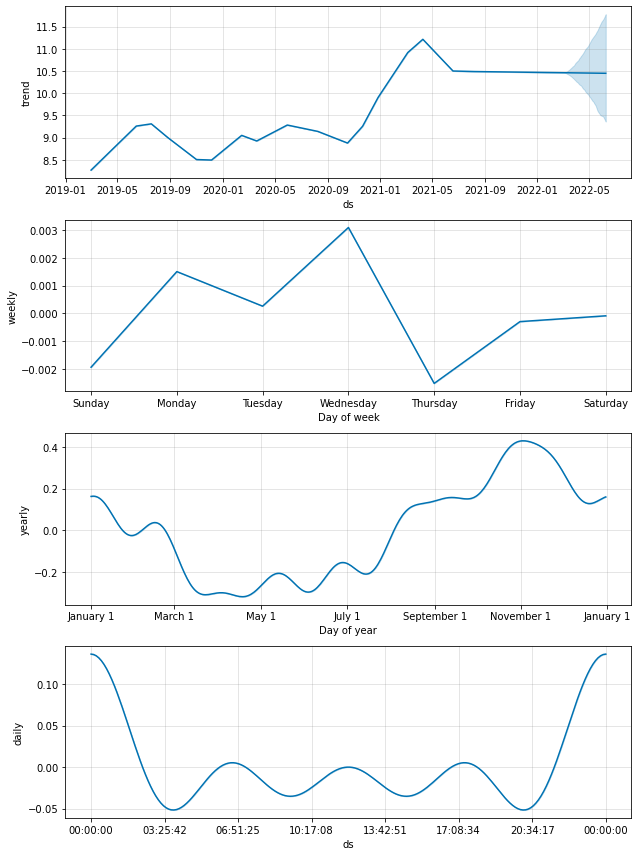

In [307]:
plot2 = m.plot_components(forecast)

In [308]:
plot_plotly(model,forecast)

In [309]:
from fbprophet.diagnostics import cross_validation
btc_cv = cross_validation(model, horizon = '100 days')

INFO:fbprophet:Making 13 forecasts with cutoffs between 2020-03-31 00:00:00 and 2021-11-21 00:00:00


  0%|          | 0/13 [00:00<?, ?it/s]

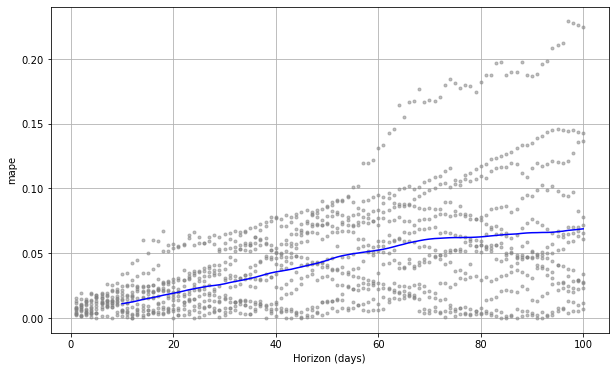

In [310]:
from fbprophet import plot
fig2 = plot.plot_cross_validation_metric(btc_cv, metric='mape')

In [311]:
from fbprophet.diagnostics import performance_metrics
btc_performance= performance_metrics(btc_cv)

btc_performance

,horizon,mse,rmse,mae,mape,mdape,coverage
0,10 days,0.016836,0.129755,0.111489,0.011033,0.010881,0.553846
1,11 days,0.019122,0.138284,0.118249,0.011696,0.011493,0.530769
2,12 days,0.022122,0.148736,0.125547,0.012399,0.012114,0.484615
3,13 days,0.025837,0.160740,0.134496,0.013265,0.012743,0.461538
4,14 days,0.030827,0.175576,0.144621,0.014240,0.013088,0.423077
...,...,...,...,...,...,...,...
86,96 days,0.795471,0.891892,0.690895,0.067012,0.048611,0.676923
87,97 days,0.813347,0.901857,0.696470,0.067603,0.049583,0.676923
88,98 days,0.829342,0.910682,0.700258,0.067994,0.049935,0.676923
89,99 days,0.847539,0.920619,0.704410,0.068406,0.050253,0.676923


In [312]:

eth = yf.Ticker('ETH-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
eth



ltc = yf.Ticker('LTC-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
ltc


zec = yf.Ticker('ZEC-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
zec


aur = yf.Ticker('AUR-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
aur


neo= yf.Ticker('NEO-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
neo


mzc= yf.Ticker('MZC-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
mzc


bch= yf.Ticker('BCH-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
bch


xrp= yf.Ticker('XRP-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
xrp


ada= yf.Ticker('ADA-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
ada


xlm= yf.Ticker('XLM-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
xlm


usdt= yf.Ticker('USDT-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
usdt


etc= yf.Ticker('ETC-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
etc


xmr= yf.Ticker('XMR-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
xmr


dash= yf.Ticker('DASH-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
dash


firo= yf.Ticker('FIRO-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
firo


dg= yf.Ticker('Dg-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
dg


algo = yf.Ticker('ALGO-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
algo


vet = yf.Ticker('VET-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
vet

nano= yf.Ticker('Nano-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
nano

xtz= yf.Ticker('XTZ-USD').history(start='2019-03-01', end='2022-03-01', interval="1d")
#Show the data
xtz

- MZC-USD: No data found, symbol may be delisted
- NANO-USD: No data found for this date range, symbol may be delisted


,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2019-03-01,0.409746,0.416146,0.408032,0.411654,5116450,0,0
2019-03-02,0.410496,0.413108,0.402604,0.406324,4317693,0,0
2019-03-03,0.405552,0.422028,0.402475,0.405318,4894782,0,0
2019-03-04,0.404982,0.412259,0.397950,0.405765,4848080,0,0
2019-03-05,0.407429,0.424089,0.404828,0.419979,4415497,0,0
...,...,...,...,...,...,...,...
2022-02-25,3.032464,3.248102,2.969217,3.205754,170038301,0,0
2022-02-26,3.206210,3.486655,3.206210,3.416615,184081442,0,0
2022-02-27,3.415262,3.443890,3.079345,3.115932,185266059,0,0


In [313]:
#Data preparation
df_eth = eth.drop(eth.columns[[0,1,2,4,5,6]], axis=1)
df_eth.columns = ['y']
df_eth = pd.DataFrame(df_eth.index)

df_eth['y'] = df_eth.to_numpy()

df_eth.columns = ['ds', 'y']
new_eth = eth.drop(eth.columns[[0,1,2,4,5,6]], axis=1)
new_eth.columns = ['y']
df_eth= pd.DataFrame(new_eth.index)

df_eth['y'] = new_eth.to_numpy()

df_eth.columns = ['ds', 'y']
df_eth


df_ltc = ltc.drop(ltc.columns[[0,1,2,4,5,6]], axis=1)
df_ltc.columns = ['y']
df_ltc = pd.DataFrame(df_ltc.index)

df_ltc['y'] = df_ltc.to_numpy()

df_ltc.columns = ['ds', 'y']
new_ltc = ltc.drop(ltc.columns[[0,1,2,4,5,6]], axis=1)
new_ltc.columns = ['y']
df_ltc= pd.DataFrame(new_ltc.index)

df_ltc['y'] = new_ltc.to_numpy()

df_ltc.columns = ['ds', 'y']
df_ltc


df_zec = zec.drop(zec.columns[[0,1,2,4,5,6]], axis=1)
df_zec.columns = ['y']
df_zec = pd.DataFrame(df_zec.index)

df_zec['y'] = df_zec.to_numpy()

df_zec.columns = ['ds', 'y']
new_zec = zec.drop(zec.columns[[0,1,2,4,5,6]], axis=1)
new_zec.columns = ['y']
df_zec= pd.DataFrame(new_zec.index)

df_zec['y'] = new_zec.to_numpy()

df_zec.columns = ['ds', 'y']
df_zec

df_aur = aur.drop(aur.columns[[0,1,2,4,5,6]], axis=1)
df_aur.columns = ['y']
df_aur = pd.DataFrame(df_aur.index)

df_aur['y'] = df_aur.to_numpy()

df_aur.columns = ['ds', 'y']
new_aur = aur.drop(aur.columns[[0,1,2,4,5,6]], axis=1)
new_aur.columns = ['y']
df_aur= pd.DataFrame(new_aur.index)

df_aur['y'] = new_aur.to_numpy()

df_aur.columns = ['ds', 'y']
df_aur



df_neo = neo.drop(neo.columns[[0,1,2,4,5,6]], axis=1)
df_neo.columns = ['y']
df_neo = pd.DataFrame(df_neo.index)

df_neo['y'] = df_neo.to_numpy()

df_neo.columns = ['ds', 'y']
new_neo = neo.drop(neo.columns[[0,1,2,4,5,6]], axis=1)
new_neo.columns = ['y']
df_neo= pd.DataFrame(new_neo.index)

df_neo['y'] = new_neo.to_numpy()

df_neo.columns = ['ds', 'y']
df_neo





df_bch = bch.drop(bch.columns[[0,1,2,4,5,6]], axis=1)
df_bch.columns = ['y']
df_bch = pd.DataFrame(df_bch.index)

df_bch['y'] = df_bch.to_numpy()

df_bch.columns = ['ds', 'y']
new_bch = bch.drop(bch.columns[[0,1,2,4,5,6]], axis=1)
new_bch.columns = ['y']
df_bch= pd.DataFrame(new_bch.index)

df_bch['y'] = new_bch.to_numpy()

df_bch.columns = ['ds', 'y']
df_bch


df_xrp = xrp.drop(ltc.columns[[0,1,2,4,5,6]], axis=1)
df_xrp.columns = ['y']
df_xrp = pd.DataFrame(df_xrp.index)

df_xrp['y'] = df_xrp.to_numpy()

df_xrp.columns = ['ds', 'y']
new_xrp = xrp.drop(xrp.columns[[0,1,2,4,5,6]], axis=1)
new_xrp.columns = ['y']
df_xrp= pd.DataFrame(new_xrp.index)

df_xrp['y'] = new_xrp.to_numpy()

df_xrp.columns = ['ds', 'y']
df_xrp


df_ada = ada.drop(ada.columns[[0,1,2,4,5,6]], axis=1)
df_ada.columns = ['y']
df_ada = pd.DataFrame(df_ada.index)

df_ada['y'] = df_ada.to_numpy()

df_ada.columns = ['ds', 'y']
new_ada = ada.drop(ada.columns[[0,1,2,4,5,6]], axis=1)
new_ada.columns = ['y']
df_ada= pd.DataFrame(new_ada.index)

df_ada['y'] = new_ada.to_numpy()

df_ada.columns = ['ds', 'y']
df_ada


df_xlm = xlm.drop(xlm.columns[[0,1,2,4,5,6]], axis=1)
df_xlm.columns = ['y']
df_xlm = pd.DataFrame(df_xlm.index)

df_xlm['y'] = df_xlm.to_numpy()

df_xlm.columns = ['ds', 'y']
new_xlm = xlm.drop(xlm.columns[[0,1,2,4,5,6]], axis=1)
new_xlm.columns = ['y']
df_xlm= pd.DataFrame(new_xlm.index)

df_xlm['y'] = new_xlm.to_numpy()

df_xlm.columns = ['ds', 'y']
df_xlm


df_usdt= usdt.drop(usdt.columns[[0,1,2,4,5,6]], axis=1)
df_usdt.columns = ['y']
df_usdt = pd.DataFrame(df_usdt.index)

df_usdt['y'] = df_usdt.to_numpy()

df_usdt.columns = ['ds', 'y']
new_usdt = usdt.drop(usdt.columns[[0,1,2,4,5,6]], axis=1)
new_usdt.columns = ['y']
df_usdt= pd.DataFrame(new_usdt.index)

df_usdt['y'] = new_usdt.to_numpy()

df_usdt.columns = ['ds', 'y']
df_usdt


df_etc = etc.drop(etc.columns[[0,1,2,4,5,6]], axis=1)
df_etc.columns = ['y']
df_etc = pd.DataFrame(df_etc.index)

df_etc['y'] = df_etc.to_numpy()

df_etc.columns = ['ds', 'y']
new_etc = etc.drop(etc.columns[[0,1,2,4,5,6]], axis=1)
new_etc.columns = ['y']
df_etc= pd.DataFrame(new_ltc.index)

df_etc['y'] = new_ltc.to_numpy()

df_etc.columns = ['ds', 'y']
df_etc


df_xmr = xmr.drop(xmr.columns[[0,1,2,4,5,6]], axis=1)
df_xmr.columns = ['y']
df_xmr = pd.DataFrame(df_xmr.index)

df_xmr['y'] = df_xmr.to_numpy()

df_xmr.columns = ['ds', 'y']
new_xmr = xmr.drop(xmr.columns[[0,1,2,4,5,6]], axis=1)
new_xmr.columns = ['y']
df_xmr= pd.DataFrame(new_xmr.index)

df_xmr['y'] = new_xmr.to_numpy()

df_xmr.columns = ['ds', 'y']
df_xmr


df_dash = dash.drop(dash.columns[[0,1,2,4,5,6]], axis=1)
df_dash.columns = ['y']
df_dash= pd.DataFrame(df_dash.index)

df_dash['y'] = df_dash.to_numpy()

df_dash.columns = ['ds', 'y']
new_dash = dash.drop(dash.columns[[0,1,2,4,5,6]], axis=1)
new_dash.columns = ['y']
df_dash= pd.DataFrame(new_dash.index)

df_dash['y'] = new_dash.to_numpy()

df_dash.columns = ['ds', 'y']
df_dash


df_firo = firo.drop(firo.columns[[0,1,2,4,5,6]], axis=1)
df_firo.columns = ['y']
df_firo = pd.DataFrame(df_firo.index)

df_firo['y'] = df_firo.to_numpy()

df_firo.columns = ['ds', 'y']
new_firo = firo.drop(firo.columns[[0,1,2,4,5,6]], axis=1)
new_firo.columns = ['y']
df_firo= pd.DataFrame(new_firo.index)

df_firo['y'] = new_firo.to_numpy()

df_firo.columns = ['ds', 'y']
df_firo


df_dg = dg.drop(dg.columns[[0,1,2,4,5,6]], axis=1)
df_dg.columns = ['y']
df_dg = pd.DataFrame(df_dg.index)

df_dg['y'] = df_dg.to_numpy()

df_dg.columns = ['ds', 'y']
new_dg = dg.drop(dg.columns[[0,1,2,4,5,6]], axis=1)
new_dg.columns = ['y']
df_dg= pd.DataFrame(new_dg.index)

df_dg['y'] = new_dg.to_numpy()

df_dg.columns = ['ds', 'y']
df_dg


df_algo = algo.drop(algo.columns[[0,1,2,4,5,6]], axis=1)
df_algo.columns = ['y']
df_algo = pd.DataFrame(df_algo.index)

df_algo['y'] = df_algo.to_numpy()

df_algo.columns = ['ds', 'y']
new_algo = algo.drop(algo.columns[[0,1,2,4,5,6]], axis=1)
new_algo.columns = ['y']
df_algo= pd.DataFrame(new_algo.index)

df_algo['y'] = new_algo.to_numpy()

df_algo.columns = ['ds', 'y']
df_algo


df_vet = vet.drop(vet.columns[[0,1,2,4,5,6]], axis=1)
df_vet.columns = ['y']
df_vet = pd.DataFrame(df_vet.index)

df_vet['y'] = df_vet.to_numpy()

df_vet.columns = ['ds', 'y']
new_vet = vet.drop(vet.columns[[0,1,2,4,5,6]], axis=1)
new_vet.columns = ['y']
df_vet= pd.DataFrame(new_vet.index)

df_vet['y'] = new_vet.to_numpy()

df_vet.columns = ['ds', 'y']
df_vet


df_xtz = xtz.drop(xtz.columns[[0,1,2,4,5,6]], axis=1)
df_xtz.columns = ['y']
df_xtz = pd.DataFrame(df_xtz.index)

df_xtz['y'] = df_xtz.to_numpy()

df_xtz.columns = ['ds', 'y']
new_xtz = xtz.drop(xtz.columns[[0,1,2,4,5,6]], axis=1)
new_xtz.columns = ['y']
df_xtz= pd.DataFrame(new_xtz.index)

df_xtz['y'] = new_xtz.to_numpy()

df_xtz.columns = ['ds', 'y']
df_xtz


,ds,y
0,2019-03-01,0.411654
1,2019-03-02,0.406324
2,2019-03-03,0.405318
3,2019-03-04,0.405765
4,2019-03-05,0.419979
...,...,...
1092,2022-02-25,3.205754
1093,2022-02-26,3.416615
1094,2022-02-27,3.115932
1095,2022-02-28,3.534633


In [314]:

eth1=Prophet(interval_width=0.95, daily_seasonality= True)
ltc1=Prophet(interval_width=0.95, daily_seasonality= True)
zec1=Prophet(interval_width=0.95, daily_seasonality= True)
aur1=Prophet(interval_width=0.95, daily_seasonality= True)
neo1=Prophet(interval_width=0.95, daily_seasonality= True)
bch1=Prophet(interval_width=0.95, daily_seasonality= True)
xrp1=Prophet(interval_width=0.95, daily_seasonality= True)
ada1=Prophet(interval_width=0.95, daily_seasonality= True)
xlm1=Prophet(interval_width=0.95, daily_seasonality= True)
usdt1=Prophet(interval_width=0.95, daily_seasonality= True)
etc1=Prophet(interval_width=0.95, daily_seasonality= True)
xmr1=Prophet(interval_width=0.95, daily_seasonality= True)
dash1=Prophet(interval_width=0.95, daily_seasonality= True)
firo1=Prophet(interval_width=0.95, daily_seasonality= True)
#df_nano=Prophet(interval_width=0.95, daily_seasonality= True)
dg1=Prophet(interval_width=0.95, daily_seasonality= True)
algo1=Prophet(interval_width=0.95, daily_seasonality= True)
vet1=Prophet(interval_width=0.95, daily_seasonality= True)
xtz1=Prophet(interval_width=0.95, daily_seasonality= True)

In [315]:

eth1.fit(df_eth)
ltc1.fit(df_ltc)
zec1.fit(df_zec)
aur1.fit(df_aur)
neo1.fit(df_neo)
#mzc1.fit(df_mzc)
bch1.fit(df_bch)
xrp1.fit(df_xrp)
ada1.fit(df_ada)
xlm1.fit(df_xlm)
usdt1.fit(df_usdt)
etc1.fit(df_etc)
xmr1.fit(df_xmr)
dash1.fit(df_dash)
firo1.fit(df_firo)
#nano1.fit(df_nano)
dg1.fit(df_dg)
algo1.fit(df_algo)
vet1.fit(df_vet)
xtz1.fit(df_xtz)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


In [316]:
future1=eth1.make_future_dataframe(periods=100, freq='D')
future2=ltc1.make_future_dataframe(periods=100, freq='D')
future3=zec1.make_future_dataframe(periods=100, freq='D')
future4=aur1.make_future_dataframe(periods=100, freq='D')
future5=neo1.make_future_dataframe(periods=100, freq='D')
future6=bch1.make_future_dataframe(periods=100, freq='D')
future7=xrp1.make_future_dataframe(periods=100, freq='D')
future8=ada1.make_future_dataframe(periods=100, freq='D')
future9=xlm1.make_future_dataframe(periods=100, freq='D')
future10=usdt1.make_future_dataframe(periods=100, freq='D')
future11=etc1.make_future_dataframe(periods=100, freq='D')
future12=xmr1.make_future_dataframe(periods=100, freq='D')
future13=dash1.make_future_dataframe(periods=100, freq='D')
future14=firo1.make_future_dataframe(periods=100, freq='D')
future15=dg1.make_future_dataframe(periods=100, freq='D')
future16=algo1.make_future_dataframe(periods=100, freq='D')
future17=vet1.make_future_dataframe(periods=100, freq='D')
future18=xtz1.make_future_dataframe(periods=100, freq='D')

In [317]:
forecast1=eth1.predict(future1)
forecast2=ltc1.predict(future2)
forecast3=zec1.predict(future3)
forecast4=aur1.predict(future4)
forecast5=neo1.predict(future5)
forecast6=bch1.predict(future6)
forecast7=xrp1.predict(future7)
forecast8=ada1.predict(future8)
forecast9=xlm1.predict(future9)
forecast10=usdt1.predict(future10)
forecast11=etc1.predict(future11)
forecast12=xmr1.predict(future12)
forecast13=dash1.predict(future13)
forecast14=firo1.predict(future14)
forecast15=dg1.predict(future15)
forecast16=algo1.predict(future16)
forecast17=vet1.predict(future17)
forecast18=eth1.predict(future18)

In [318]:
forecast['name'] = "BITCOIN"
forecast1['name'] = "ETHEREUM"
forecast2['name'] = "LITECOIN"
forecast3['name'] = "ZCASH"
forecast4['name'] = "AURORACOIN"
forecast5['name'] = "NEO"
forecast6['name'] = "BITCOINCASH"
forecast7['name'] = "RIPPLE"
forecast8['name'] = "CARDONA"
forecast9['name'] = "STELLAR"
forecast10['name'] = "Tether"
forecast11['name'] = "Ethereumclassic"
forecast12['name'] = "Monero"
forecast13['name'] = "DASH"
forecast14['name'] = "FIRO"
forecast15['name'] = "Dogecoin"
forecast16['name'] = "ALGORAND"
forecast17['name'] = "VECHAIN"
forecast18['name'] = "TEZOS"


In [319]:
forecast['Ticker'] = "BTC"
forecast1['Ticker'] = "ETH"
forecast2['Ticker'] = "LTC"
forecast3['Ticker'] = "ZEC"
forecast4['Ticker'] = "AUR"
forecast5['Ticker'] = "NEO"
forecast6['Ticker'] = "BCH"
forecast7['Ticker'] = "XRP"
forecast8['Ticker'] = "ADA"
forecast9['Ticker'] = "XLM"
forecast10['Ticker'] = "USDT"
forecast11['Ticker'] = "ETC"
forecast12['Ticker'] = "XMR"
forecast13['Ticker'] = "DASH"
forecast14['Ticker'] = "FIRO"
forecast15['Ticker'] = "Dg"
forecast16['Ticker'] = "ALGO"
forecast17['Ticker'] = "VET"
forecast18['Ticker'] = "XTZ"


In [320]:
forecast[['ds', 'yhat']]
forecast1[['ds', 'yhat']]
forecast2[['ds', 'yhat']]
forecast3[['ds', 'yhat']]
forecast4[['ds', 'yhat']]
forecast5[['ds', 'yhat']]
forecast6[['ds', 'yhat']]
forecast7[['ds', 'yhat']]
forecast8[['ds', 'yhat']]
forecast9[['ds', 'yhat']]
forecast10[['ds', 'yhat']]
forecast11[['ds', 'yhat']]
forecast12[['ds', 'yhat']]
forecast13[['ds', 'yhat']]
forecast14[['ds', 'yhat']]
forecast15[['ds', 'yhat']]
forecast16[['ds', 'yhat']]
forecast17[['ds', 'yhat']]
forecast18[['ds', 'yhat']]

,ds,yhat
0,2019-03-01,59.600154
1,2019-03-02,61.851634
2,2019-03-03,64.744012
3,2019-03-04,66.315732
4,2019-03-05,69.775102
...,...,...
1192,2022-06-05,3982.259426
1193,2022-06-06,3977.729532
1194,2022-06-07,3975.254261
1195,2022-06-08,3982.700458


In [321]:
forecast.to_csv(r'..\Assessment\forecast_bitcoin.csv')
forecast1.to_csv(r'..\Assessment\forecast_ethereum.csv')
forecast2.to_csv(r'..\Assessment\forecast_litecoin.csv')
forecast3.to_csv(r'..\Assessment\forecast_zcash.csv')
forecast4.to_csv(r'..\Assessment\forecast_auracoin.csv')
forecast5.to_csv(r'..\Assessment\forecast_neo.csv')
forecast6.to_csv(r'..\Assessment\forecast_bitcoincash.csv')
forecast7.to_csv(r'..\Assessment\forecast_ripple.csv')
forecast8.to_csv(r'..\Assessment\forecast_cardona.csv')
forecast9.to_csv(r'..\Assessment\forecast_stellar.csv')
forecast10.to_csv(r'..\Assessment\forecast_tether.csv')
forecast11.to_csv(r'..\Assessment\forecast_ethereumclassic.csv')
forecast12.to_csv(r'..\Assessment\forecast_monero.csv')
forecast13.to_csv(r'..\Assessment\forecast_dash.csv')
forecast14.to_csv(r'..\Assessment\forecast_firo.csv')
forecast15.to_csv(r'..\Assessment\forecast_dogecoin.csv')
forecast16.to_csv(r'..\Assessment\forecast_algogrand.csv')
forecast17.to_csv(r'..\Assessment\forecast_vechain.csv')
forecast18.to_csv(r'..\Assessment\forecast_tezos.csv')

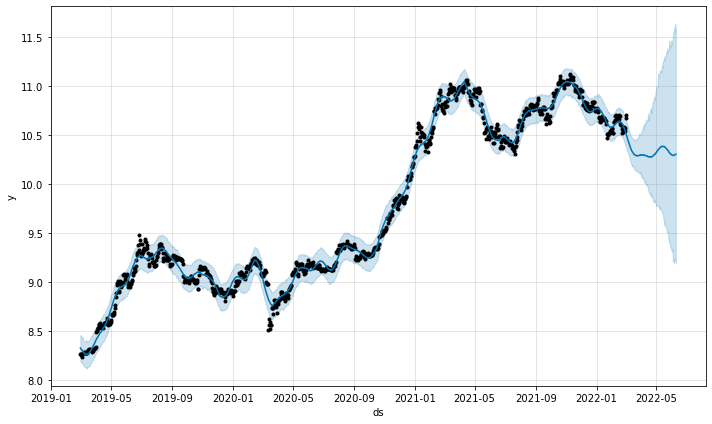

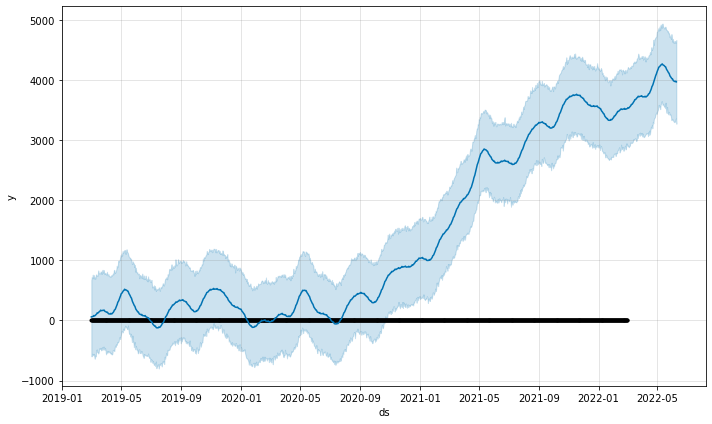

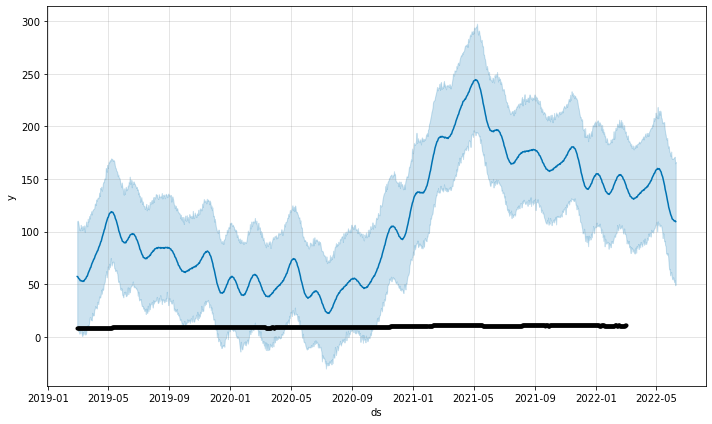

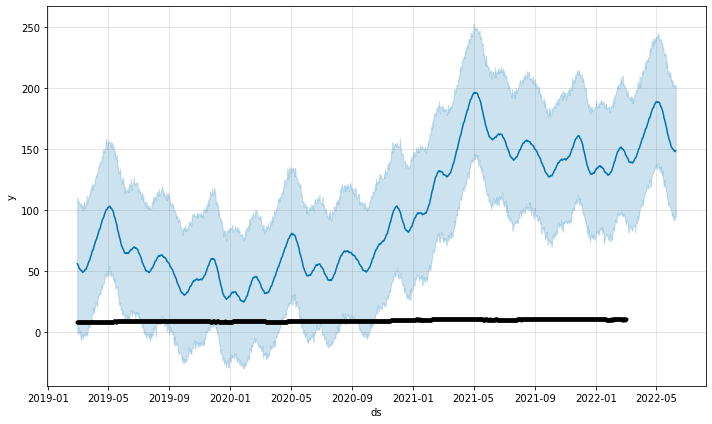

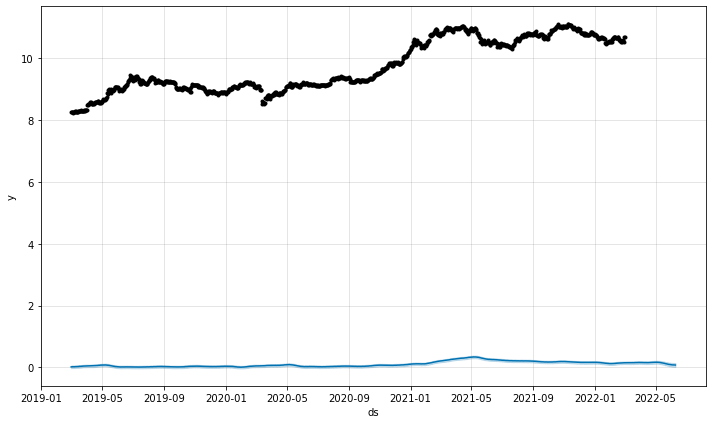

...

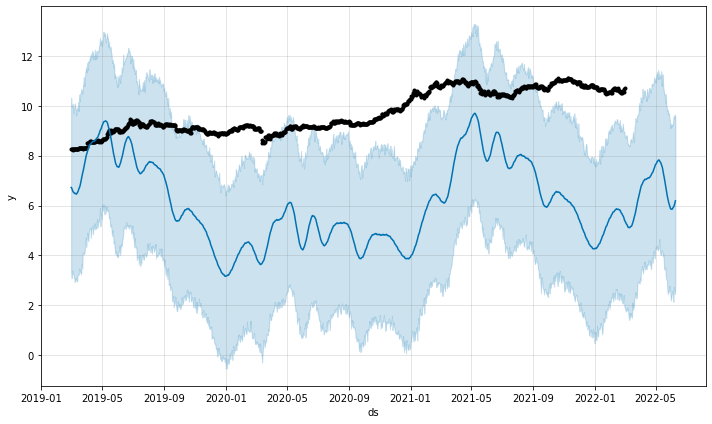

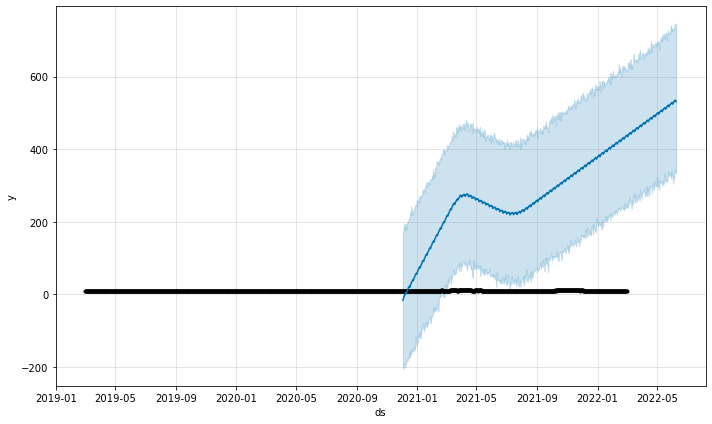

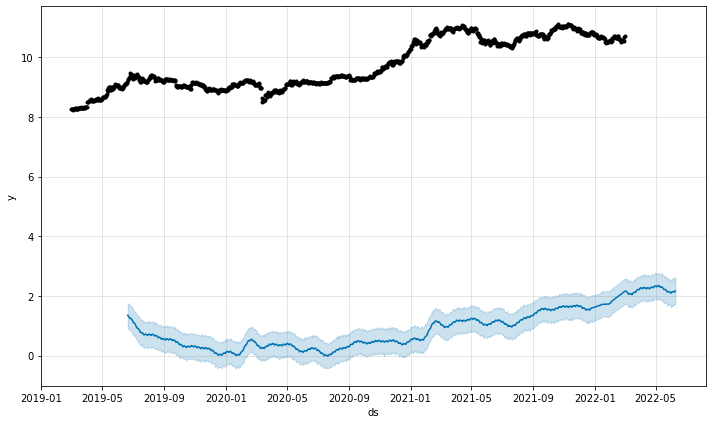

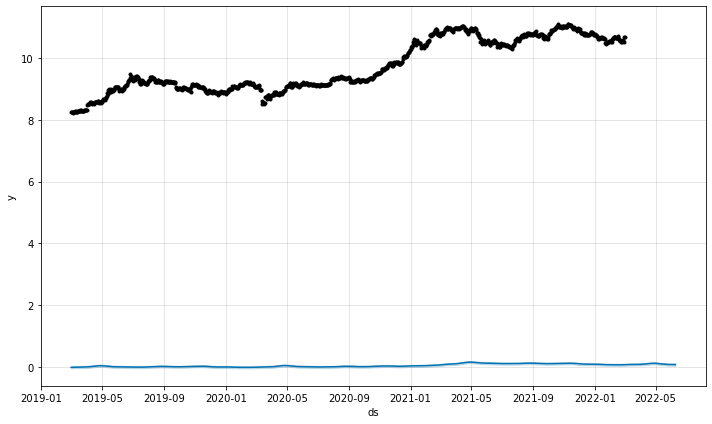

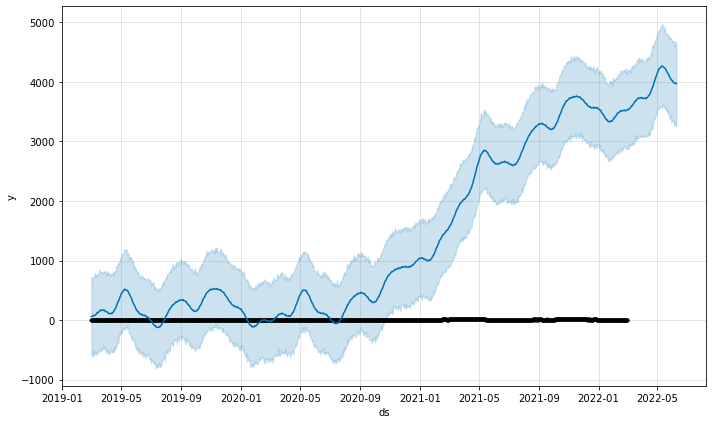

In [322]:
plot1 = m.plot(forecast)
plot1 = m.plot(forecast1)
plot1 = m.plot(forecast2)
plot1 = m.plot(forecast3)
plot1 = m.plot(forecast4)
plot1 = m.plot(forecast5)
plot1 = m.plot(forecast6)
plot1 = m.plot(forecast7)
plot1 = m.plot(forecast8)
plot1 = m.plot(forecast9)
plot1 = m.plot(forecast10)
plot1 = m.plot(forecast11)
plot1 = m.plot(forecast12)
plot1 = m.plot(forecast13)
plot1 = m.plot(forecast14)
plot1 = m.plot(forecast15)
plot1 = m.plot(forecast16)
plot1 = m.plot(forecast17)
plot1 = m.plot(forecast18)

In [323]:
def fb_plot(m,fore):
    return m.plot(forecast), m.plot_components(forecast)

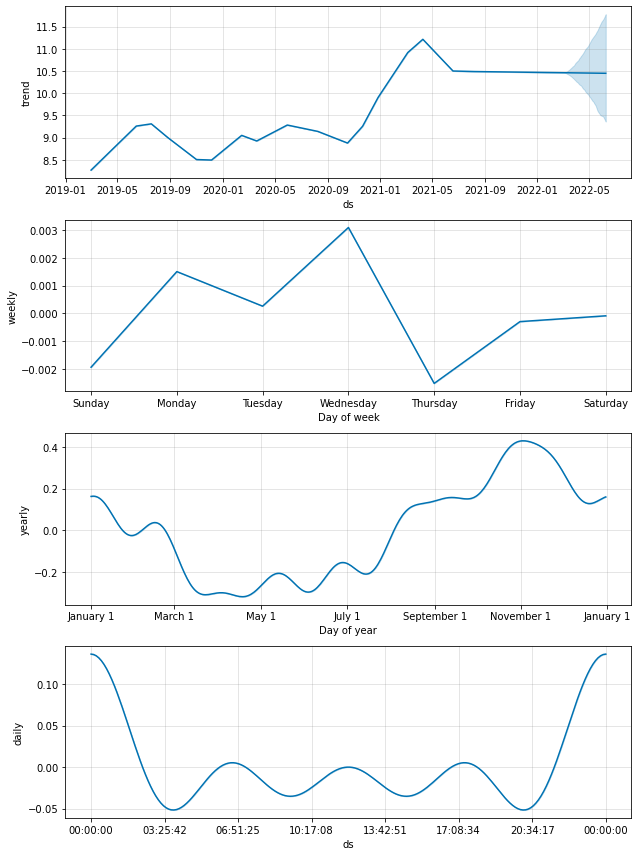

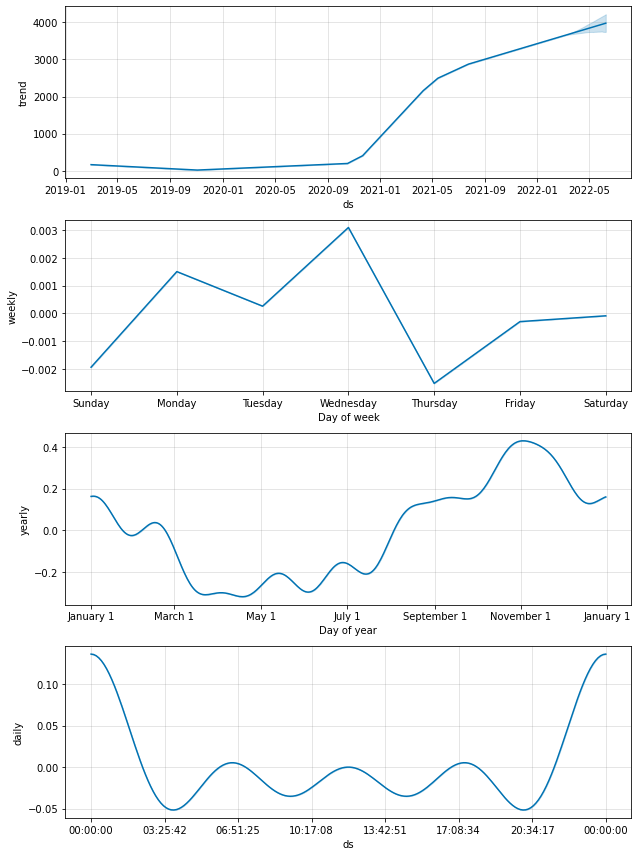

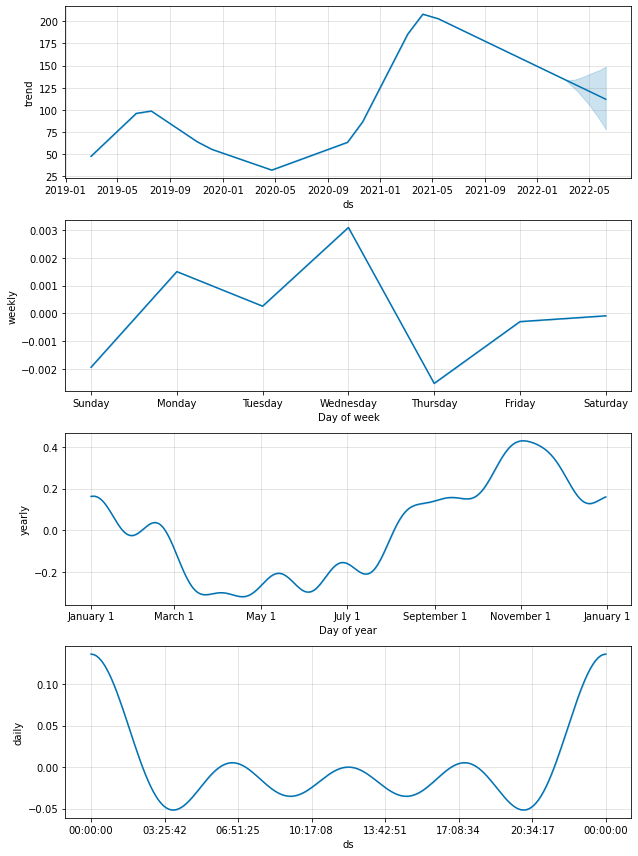

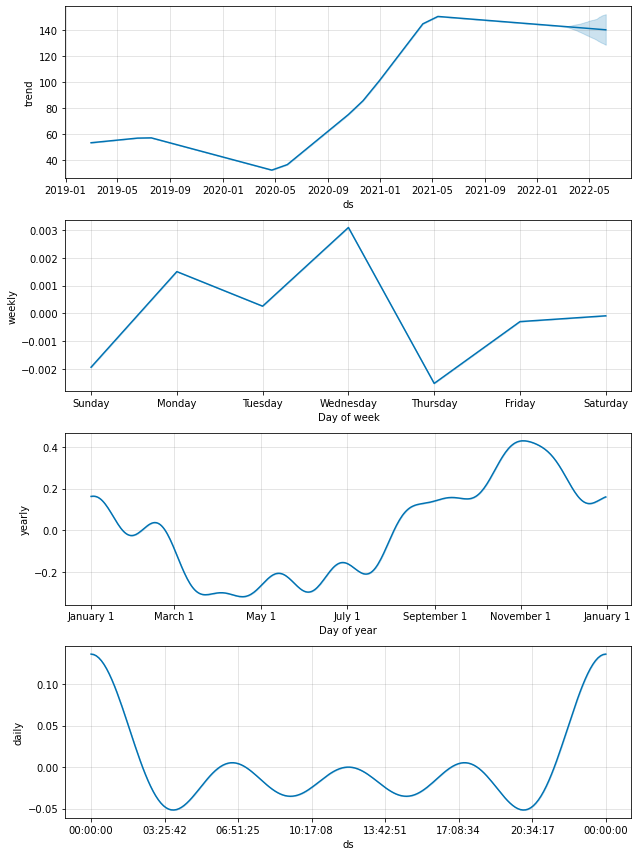

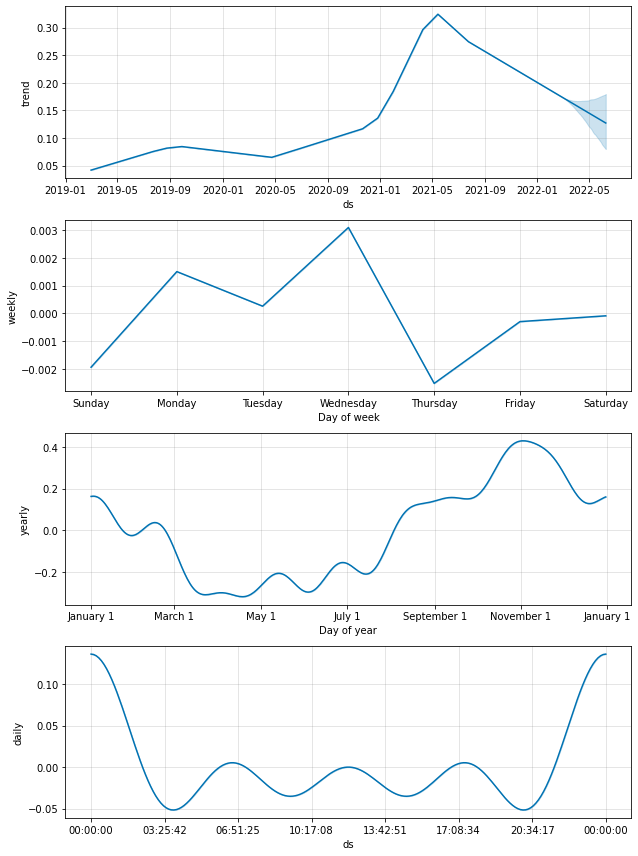

...

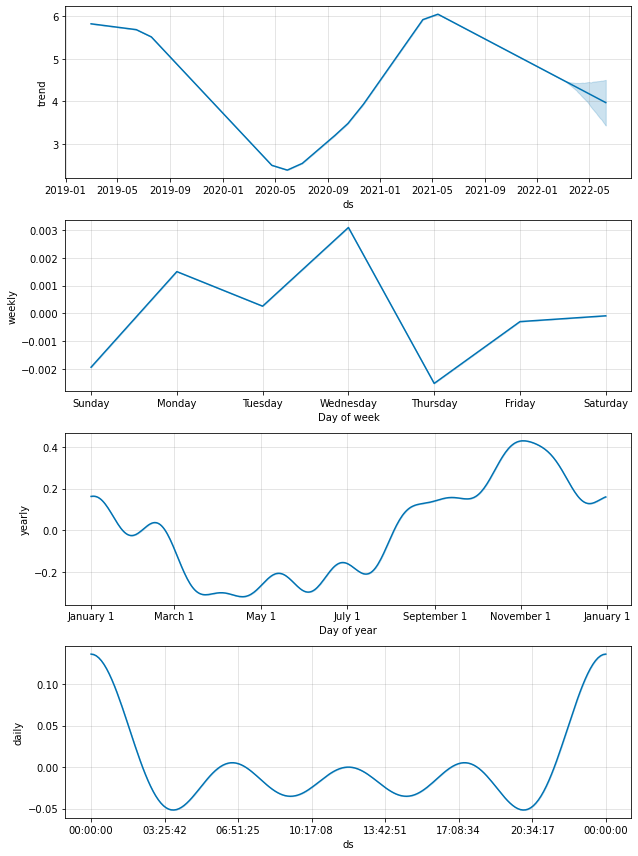

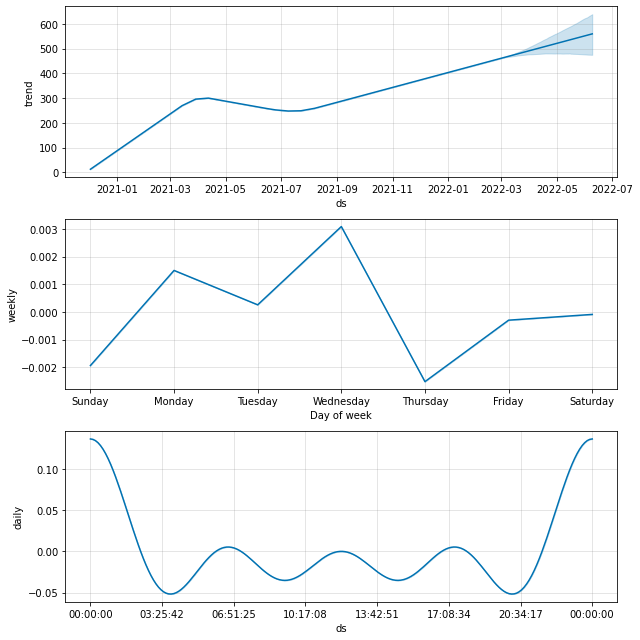

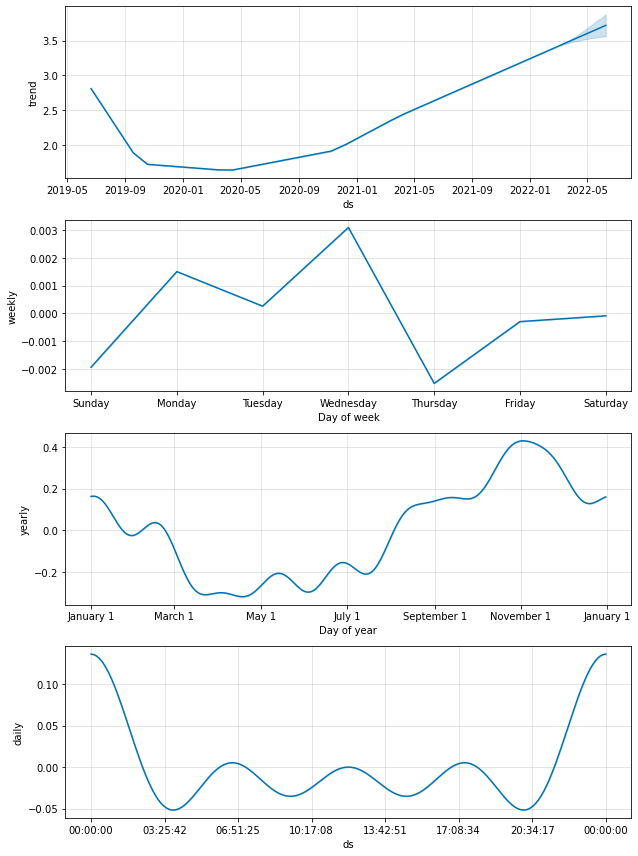

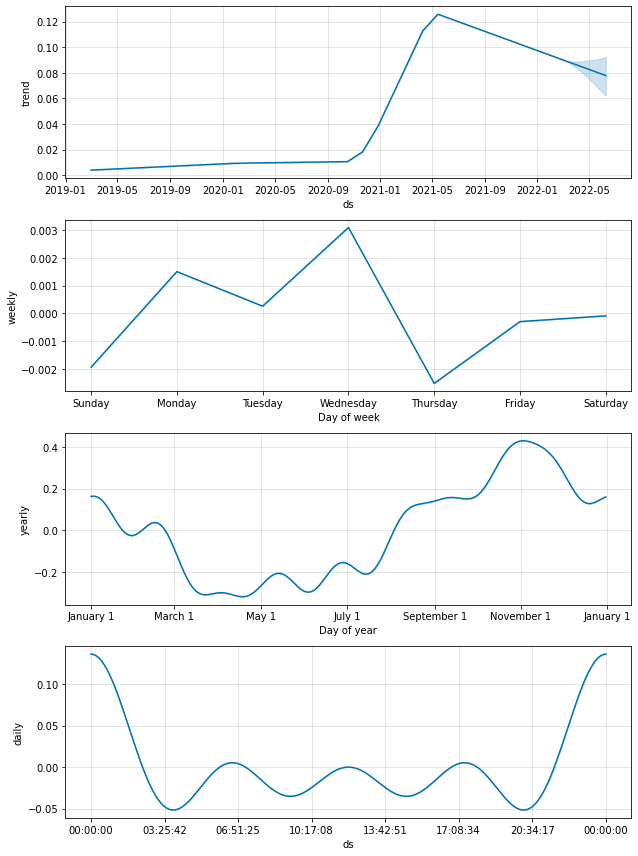

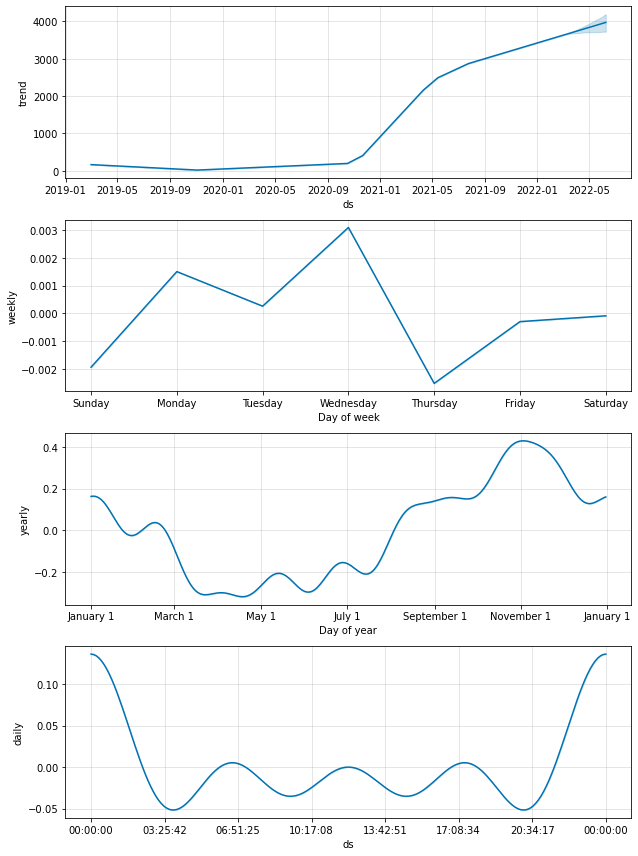

In [324]:
plot2 = m.plot_components(forecast)
plot2 = m.plot_components(forecast1)
plot2 = m.plot_components(forecast2)
plot2 = m.plot_components(forecast3)
plot2 = m.plot_components(forecast4)
plot2 = m.plot_components(forecast5)
plot2 = m.plot_components(forecast6)
plot2 = m.plot_components(forecast7)
plot2 = m.plot_components(forecast8)
plot2 = m.plot_components(forecast9)
plot2 = m.plot_components(forecast10)
plot2 = m.plot_components(forecast11)
plot2 = m.plot_components(forecast12)
plot2 = m.plot_components(forecast13)
plot2 = m.plot_components(forecast14)
plot2 = m.plot_components(forecast15)
plot2 = m.plot_components(forecast16)
plot2 = m.plot_components(forecast17)
plot2 = m.plot_components(forecast18)

In [325]:
plot_plotly(model,forecast)


In [326]:
import joblib
for_eth='for_eth.sav'
joblib.dump(forecast1, for_eth)

['for_eth.sav']

In [327]:
import joblib
#creating folder for our models
#forecast=btc1.predict(future)
#forecast1=eth1.predict(future1)
for_eth='for_eth.sav'
joblib.dump(eth1, for_eth)

#forecast2=ltc1.predict(future2)
for_ltc='for_ltc.sav'
joblib.dump(ltc1, for_ltc)

#forecast3=zec1.predict(future3)
for_zec='for_zec.sav'
joblib.dump(zec1, for_zec)

#forecast4=aur1.predict(future4)
for_aur='for_aur.sav'
joblib.dump(aur1, for_aur)

#forecast5=neo1.predict(future5)
for_neo='for_neo.sav'
joblib.dump(neo1, for_neo)


#forecast6=bch1.predict(future6)
for_bch='for_bch.sav'
joblib.dump(bch1, for_bch)


#forecast7=xrp1.predict(future7)
for_xrp='for_xrp.sav'
joblib.dump(xrp1, for_xrp)


#forecast8=ada1.predict(future8)
for_ada='for_ada.sav'
joblib.dump(ada1, for_ada)


#forecast9=xlm1.predict(future9)
for_xlm='for_xlm.sav'
joblib.dump(xlm1, for_xlm)


#forecast10=usdt1.predict(future10)
for_usdt='for_usdt.sav'
joblib.dump(usdt1, for_usdt)


#forecast11=etc1.predict(future11)
for_etc='for_etc.sav'
joblib.dump(etc1, for_etc)


#forecast12=xmr1.predict(future12)
for_xmr='for_xmr.sav'
joblib.dump(xmr1, for_xmr)


#forecast13=dash1.predict(future13)
for_dash='for_dash.sav'
joblib.dump(dash1, for_dash)


#forecast14=firo1.predict(future14)
for_firo='for_firo.sav'
joblib.dump(firo1, for_firo)


#forecast15=dg1.predict(future15)
for_dg='for_dg.sav'
joblib.dump(dg1, for_dg)


#forecast16=algo1.predict(future16)
for_algo='for_algo.sav'
joblib.dump(algo1, for_algo)


#forecast17=vet1.predict(future17)
for_vet='for_vet.sav'
joblib.dump(vet1, for_vet)


#forecast18=eth1.predict(future18)
for_eth='for_eth.sav'
joblib.dump(eth1, for_eth)

#for bitcoin
for_btc='for_btc.sav'
joblib.dump(m, for_btc)


['for_btc.sav']